# Monthly average retail prices for gasoline and fuel oil, by geography

# Project Plan

- Project Goal
- Dataset and features
- Data analysis: Explore and Clean the data to perform Analysis
- Build Visualizations: Patterns, features and unusual behavior  of data
- Get Predictive: Model Prediction to forcase the future prices
- Impacts on  average retail prices for gasoline and fuel oil, by geography
- Conclusions

## Data Source
- Statistics Canada,
- Environment, Energy and Transportation Statistics Division.
- Monthly average retail prices for gasoline and fuel oil
- DOI:    https://doi.org/10.25318/1810000101-eng

# Project Goal

#### In this project, I have analyzed  monthly average retail prices for gasoline and other fuels  in a number of Canadian cities,  and  developed a time series model to forecast future gas prices




# Introduction

- Gasoline is one of the most important energy resources in Canada whose price fluctuates everyday. The change in price has a direct impact on  both oil exporting and oil consuming provinces, the sales and profits of major industries, capital budgeting plans,  and also on how we spend—and earn—our salary. Statistics Canada tracks gasoline and fuel prices using a number of key indexes: Consumer Price Index (CPI),  Producer Price Indexes (PPI) etc,. 


- There are different types of gasoline products and this data set includes monthly average retail prices for  the following gasoline and fuel oil products: 
 1. Regular unleaded gasoline at full service filling stations,
 2. Regular unleaded gasoline at self service filling stations,
 3. Premium unleaded gasoline at full service filling stations,
 4. Premium unleaded gasoline at self service filling stations,
 5. Diesel fuel at full service filling stations,
 6. Household heating fuel,
 7. Diesel fuel at self service filling stations.



## Explore and Clean the data 

In order to have a better visualization of  the retail gasoline oil price, we need to first understand  the data. Therefore, in the following section features of this retail gasoline price dataset has been explored.

In [728]:
%matplotlib inline
#Import the libraries
import numpy as np
import pandas as pd
#Import Plotly
import plotly.offline as pyo
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib as mpl

# Import the models

from sklearn import linear_model
from sklearn.model_selection import cross_val_score
import seaborn as sns
import statsmodels.api as sm
from matplotlib import pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
from dateutil.parser import parse
from scipy.optimize import curve_fit


from sklearn.linear_model import LinearRegression
from sklearn import linear_model
import datetime

In [729]:
plt.rcParams.update({'figure.figsize': (10, 7), 'figure.dpi': 120})

In [730]:
data = pd.read_csv('../GFO-Model/18100001-eng/18100001.csv')
#Lets import data as a pandas Dataframe
df = pd.read_csv('../GFO-Model/18100001-eng/18100001.csv', parse_dates=['REF_DATE'])

In [731]:
data.head(3)

,REF_DATE,GEO,DGUID,Type of fuel,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
0,1979-01,"St. John's, Newfoundland and Labrador",2011S0503001,Regular unleaded gasoline at full service fill...,Cents per litre,57,units,0,v735046,2.1,26.0,NaN,NaN,t,1
1,1979-01,"Charlottetown and Summerside, Prince Edward Is...",NaN,Regular unleaded gasoline at full service fill...,Cents per litre,57,units,0,v735056,3.1,24.6,NaN,NaN,t,1
2,1979-01,"Halifax, Nova Scotia",2011S0503205,Regular unleaded gasoline at full service fill...,Cents per litre,57,units,0,v735057,4.1,23.4,NaN,NaN,t,1


### Lets explore the "Type of fuel"

In [732]:
sectors = {i[0]:i[1] for i in enumerate(data['Type of fuel'].unique())}
sectors = {j[0]:j[1] for j in enumerate(df['Type of fuel'].unique())}
sectors

{0: 'Regular unleaded gasoline at full service filling stations',
 1: 'Regular unleaded gasoline at self service filling stations',
 2: 'Premium unleaded gasoline at full service filling stations',
 3: 'Premium unleaded gasoline at self service filling stations',
 4: 'Diesel fuel at full service filling stations',
 5: 'Household heating fuel',
 6: 'Diesel fuel at self service filling stations'}

- This shows that this data contains price for seven different type of gasoline fuel

### Lets explore all the columns of data

In [733]:
data.columns

Index(['REF_DATE', 'GEO', 'DGUID', 'Type of fuel', 'UOM', 'UOM_ID',
       'SCALAR_FACTOR', 'SCALAR_ID', 'VECTOR', 'COORDINATE', 'VALUE', 'STATUS',
       'SYMBOL', 'TERMINATED', 'DECIMALS'],
      dtype='object')

### Lets explore the "GEO"

In [734]:
data['GEO'].unique()

array(["St. John's, Newfoundland and Labrador",
       'Charlottetown and Summerside, Prince Edward Island',
       'Halifax, Nova Scotia', 'Saint John, New Brunswick',
       'Québec, Quebec', 'Montréal, Quebec',
       'Ottawa-Gatineau, Ontario part, Ontario/Quebec',
       'Toronto, Ontario', 'Thunder Bay, Ontario', 'Winnipeg, Manitoba',
       'Regina, Saskatchewan', 'Saskatoon, Saskatchewan',
       'Edmonton, Alberta', 'Calgary, Alberta',
       'Vancouver, British Columbia', 'Victoria, British Columbia',
       'Whitehorse, Yukon', 'Yellowknife, Northwest Territories'],
      dtype=object)

- This shows that this data contains gasoline price for ten different provincial locations in Canada. Lets split these Geo names.

In [735]:
City = [i.split(',')[0] for i in df['GEO'].unique()]
Province = [i.split(',')[1] for i in df['GEO'].unique()]
print(City)
print(Province)

["St. John's", 'Charlottetown and Summerside', 'Halifax', 'Saint John', 'Québec', 'Montréal', 'Ottawa-Gatineau', 'Toronto', 'Thunder Bay', 'Winnipeg', 'Regina', 'Saskatoon', 'Edmonton', 'Calgary', 'Vancouver', 'Victoria', 'Whitehorse', 'Yellowknife']
[' Newfoundland and Labrador', ' Prince Edward Island', ' Nova Scotia', ' New Brunswick', ' Quebec', ' Quebec', ' Ontario part', ' Ontario', ' Ontario', ' Manitoba', ' Saskatchewan', ' Saskatchewan', ' Alberta', ' Alberta', ' British Columbia', ' British Columbia', ' Yukon', ' Northwest Territories']


In [736]:
GeoName = {i[0] : i[1] for i in enumerate(df['GEO'].unique())}
GeoName

{0: "St. John's, Newfoundland and Labrador",
 1: 'Charlottetown and Summerside, Prince Edward Island',
 2: 'Halifax, Nova Scotia',
 3: 'Saint John, New Brunswick',
 4: 'Québec, Quebec',
 5: 'Montréal, Quebec',
 6: 'Ottawa-Gatineau, Ontario part, Ontario/Quebec',
 7: 'Toronto, Ontario',
 8: 'Thunder Bay, Ontario',
 9: 'Winnipeg, Manitoba',
 10: 'Regina, Saskatchewan',
 11: 'Saskatoon, Saskatchewan',
 12: 'Edmonton, Alberta',
 13: 'Calgary, Alberta',
 14: 'Vancouver, British Columbia',
 15: 'Victoria, British Columbia',
 16: 'Whitehorse, Yukon',
 17: 'Yellowknife, Northwest Territories'}

In [737]:
#data['REF_DATE'].unique()

- This shows that the data set contains  average monthly price  of gasoline from January 1979 to January 2020 from ten different provinces and 17 different citites in Canada

## Visuaization of  the gas price  

In [738]:
fig = px.scatter(data, x="REF_DATE", y="VALUE", color="GEO",
                color_discrete_sequence=px.colors.qualitative.Vivid)
fig.for_each_trace(
    lambda trace: trace.update(name=trace.name.replace("=", ": ")),
)
fig.update_layout(
    title="Gasoline Price in Canadian cities",
    xaxis_title="Year",
    yaxis_title="Gasoline Price (CAD)",
)

fig.show()

In [739]:
fig = px.scatter(data[(data['Type of fuel']==sectors[3])], x='REF_DATE', y = "VALUE", 
             color = "GEO", color_discrete_sequence=px.colors.qualitative.Dark24)
fig.update_traces(mode='markers+lines')
fig.update_layout(
    title="Gasoline Price in Canadian cities",
    xaxis_title="Year",
    yaxis_title="Gasoline Price (CAD)",
)
fig.show()

In [740]:
fig_test = go.Figure()
for locations in df['GEO'].unique():
    for sector in df['Type of fuel'].unique():
        reg_df = df[(df['GEO']==locations) &
                 (df['Type of fuel']==sector) ]
        fig_test.add_trace(go.Scatter(x=reg_df['REF_DATE'],y=reg_df['VALUE'],name=sector,visible=False,line=dict(),mode="lines+markers"))

def return_list(len_geo=18,len_sector=7):
    output = []
    falses = np.array(False*len_geo*len_sector)
    output.append(dict(label="None",method="update",args=[{"visible":list(falses.reshape(-1))},{"title":"nothing"}]))
    for i in range(0,len_geo):
        falses = np.array([False]*len_geo*len_sector)
        labels=GeoName[i]
        methods = "update"
        falses[i*len_sector:(i+1)*len_sector] = True
        arg = [{"visible":list(falses.reshape(-1))},{"title": "Gas Price in " + GeoName[i]}]
        temp = dict(label=labels,method=methods,args=arg)
        output.append(temp)       
    return output
fig_test.update_layout(margin=dict(t=100, b=0, l=0, r=0))
fig_test.update_layout(updatemenus=[dict(active=0,buttons=return_list(),xanchor='left',yanchor='top')])
fig_test.update_layout(
    title="Gasoline Price in Canadian cities",
    xaxis_title="Year",
    yaxis_title="Gasoline Price (CAD)",
)

#fig_test.write_html("Test.html",include_plotlyjs="cdn",auto_open=True)
fig_test.show()

In [741]:
fig = px.bar(data[(data['GEO']!="Canada") 
            & (data['Type of fuel']==sectors[2])]
            , x='GEO', y = "VALUE",animation_frame="REF_DATE")
fig.update_layout(
    title="Gasoline Price in Canadian cities",
    xaxis_title="Year",
    yaxis_title="Gasoline Price (CAD)",
)

fig.show()

In [742]:
reg_df = df[df['REF_DATE']==df['REF_DATE'][50]]
fig = px.sunburst(reg_df, path=['GEO','Type of fuel'], values='VALUE',
                  color='GEO',color_continuous_scale='RdBu'
                  #,color_continuous_midpoint=reduced_df['VALUE']
                  ,color_continuous_midpoint=reg_df['VALUE']
                 )
fig.show()

In [743]:
#fig = px.pie(data[data['GEO']!="Canada"], values='VALUE', names='GEO')
#fig.update_traces(textposition='inside')
#fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
#fig.show()

# Get Predictive

## Oil Price Forecasting: Time Series Models Including Linear Regression Model and  ARIMA Model


- Data in monthly average retail prices for gasoline and fuel oil, by geography are indexed in time order as time series.
- First Simple Linear Regression model is used to predict the dependent variable (price)  according to time.

-  Lets visualize Gas Price for a  specific GeoName, Regina.

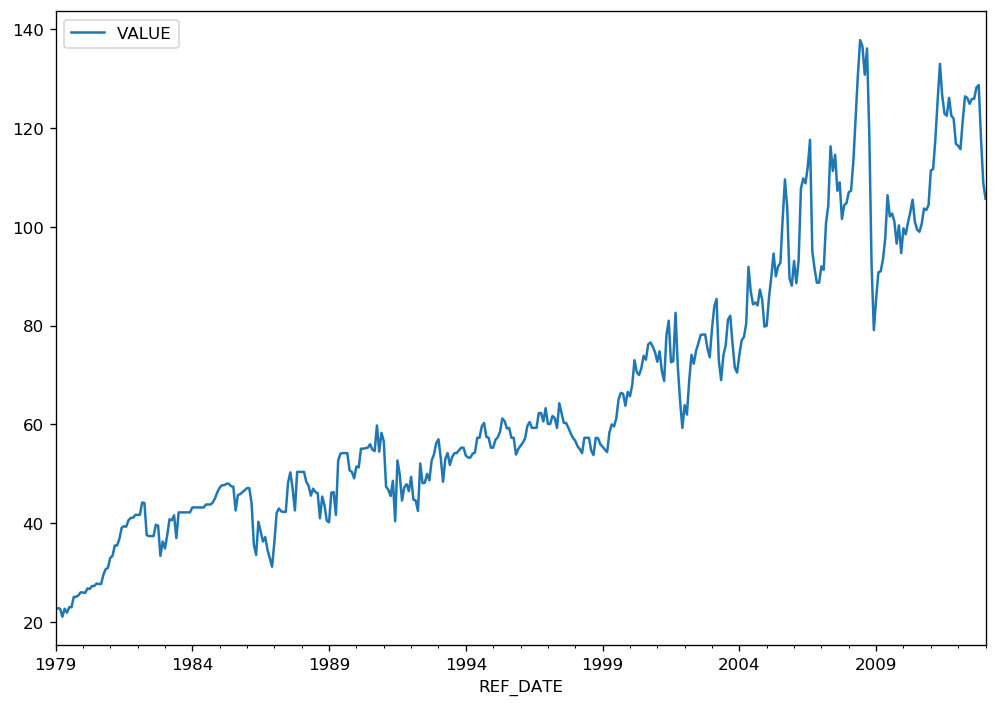

In [744]:
reg_df = df[(df['GEO']==GeoName[10]) ]
reg_df = reg_df[(reg_df['Type of fuel']==sectors[0]) ]
#df1 = reg_df[['REF_DATE','VALUE']]
Value_df = reg_df[["REF_DATE","VALUE"]]
Value_df = Value_df.set_index("REF_DATE")
Value_df.plot()


In [746]:
Value_df = reg_df[["REF_DATE","VALUE"]]
Value_df

,REF_DATE,VALUE
10,1979-01-01,22.8
25,1979-02-01,22.8
40,1979-03-01,22.7
55,1979-04-01,21.1
70,1979-05-01,22.7
...,...,...
34169,2012-09-01,128.2
34287,2012-10-01,128.7
34405,2012-11-01,118.0
34523,2012-12-01,108.9


In [747]:
Value_df = Value_df.set_index('REF_DATE')
Value_df
#Value_df.plot()

,VALUE
REF_DATE,
1979-01-01,22.8
1979-02-01,22.8
1979-03-01,22.7
1979-04-01,21.1
1979-05-01,22.7
...,...
2012-09-01,128.2
2012-10-01,128.7
2012-11-01,118.0


In [748]:
Value_df.columns

Index(['VALUE'], dtype='object')

#### There is no gasoline data in some years, therefore the  NAN values  can be replaced by test statistics. The follwing  command line will  replace all NaN values with the mean of the non null values

In [749]:
#mean_value=Value_RFS['VALUE'].mean()
#Value_df['VALUE']=Value_df['VALUE'].fillna(mean_value)

In [750]:
#Value_df=Value_df.set_index('REF_DATE')

In [751]:
#Value_df

#### simple statistics 

In [752]:
Value_df.describe().T

,count,mean,std,min,25%,50%,75%,max
VALUE,409.0,65.681663,27.406733,21.1,45.7,57.3,84.1,137.8


### Lets Convert Date to Julian Format

In [753]:
Value_df['Julian'] = Value_df.index.to_julian_date()

#### Add a constant field for the linear regression

In [754]:
Value_df = sm.add_constant(Value_df)
Value_df.head()

,const,VALUE,Julian
REF_DATE,,,
1979-01-01,1.0,22.8,2443874.5
1979-02-01,1.0,22.8,2443905.5
1979-03-01,1.0,22.7,2443933.5
1979-04-01,1.0,21.1,2443964.5
1979-05-01,1.0,22.7,2443994.5


In [755]:
Value_df.tail()

,const,VALUE,Julian
REF_DATE,,,
2012-09-01,1.0,128.2,2456171.5
2012-10-01,1.0,128.7,2456201.5
2012-11-01,1.0,118.0,2456232.5
2012-12-01,1.0,108.9,2456262.5
2013-01-01,1.0,105.7,2456293.5


In [756]:
Value_df.shape

(409, 3)

##  Linear Regression  Model 

In [757]:
future_days = []
future_price = []

### Create model

In [758]:
days = Value_df["Julian"].to_frame()
price = Value_df["VALUE"].to_frame()

In [759]:
days

,Julian
REF_DATE,
1979-01-01,2443874.5
1979-02-01,2443905.5
1979-03-01,2443933.5
1979-04-01,2443964.5
1979-05-01,2443994.5
...,...
2012-09-01,2456171.5
2012-10-01,2456201.5
2012-11-01,2456232.5


In [760]:
price

,VALUE
REF_DATE,
1979-01-01,22.8
1979-02-01,22.8
1979-03-01,22.7
1979-04-01,21.1
1979-05-01,22.7
...,...
2012-09-01,128.2
2012-10-01,128.7
2012-11-01,118.0


In [761]:
linear = LinearRegression().fit(days, price)

In [762]:
last_day = 2456293.5
for i in range(1, 7000):
    future_days.append([last_day + i])
    future_price.append(np.nan)

In [763]:
linear_pred = list(map(lambda x: float(x), linear.predict(days)))
linear_pred_future = list(map(lambda x: float(x), linear.predict(future_days)))

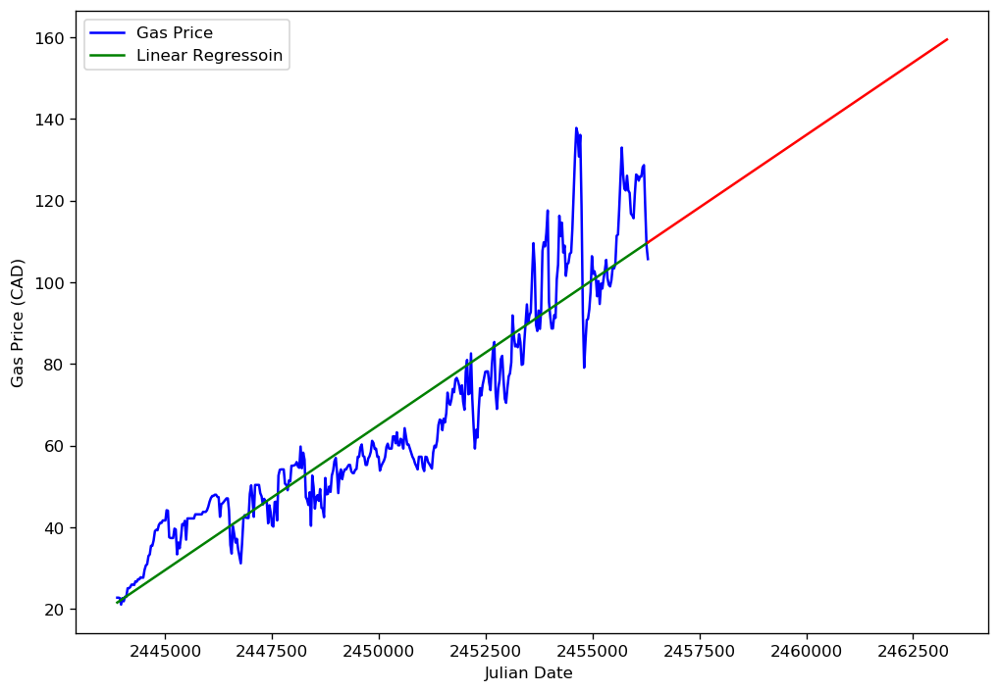

In [764]:
plt.plot(days, price, color='blue', label='Gas Price')
plt.plot(days, linear_pred, color='green', label='Linear Regressoin')
plt.plot(future_days, linear_pred_future, color='red')
plt.xlabel('Julian Date ')
plt.ylabel('Gas Price (CAD)')
plt.legend(loc=2)
plt.show()

In [765]:
len(future_days)

6999

In [766]:
len(future_price)

6999

## Exponential Model

In [767]:
exponential_model = linear_model.Ridge().fit( 
    X=Value_df[['Julian', 'const']], 
    y=np.log(Value_df['VALUE'])
)

In [768]:
exp_model_df = Value_df
exp_model_df['Exponential_Model'] = np.exp(exponential_model.predict(Value_df[['Julian', 'const']]))
exp_model_df['Log_Error_Exponential'] = np.log(Value_df['VALUE'] / Value_df['Exponential_Model'])

In [769]:
Value_df.head(2)

,const,VALUE,Julian,Exponential_Model,Log_Error_Exponential
REF_DATE,,,,,
1979-01-01,1.0,22.8,2443874.5,30.384997,-0.287188
1979-02-01,1.0,22.8,2443905.5,30.489206,-0.290612


(108.0, 550)

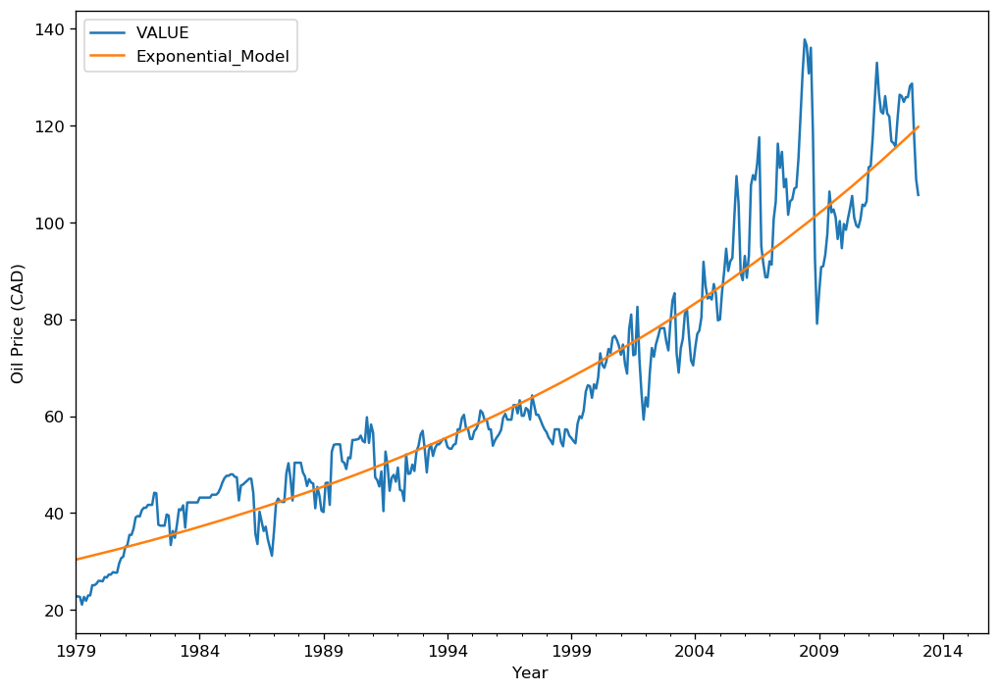

In [770]:
exp_model_df[['VALUE',   'Exponential_Model']].plot()
plt.xlabel('Year ')
plt.ylabel('Oil Price (CAD)')
plt.xlim(right=550) 

## Auto Regressive Integrated Moving Average (ARIMA) Model 

### Explore: ARIMA model  has mainly three Components

- The term ‘Auto Regressive’ in ARIMA means it is a linear regression model that uses its own lags as predictors. This model works best when the predictors are not correlated and are independent of each other.
- In ARIMA model, there are 3 parameters that are used to help model the major aspects of a times series: **seasonality, trend, and noise**. 


- **Seasionality**: How increase or decrease in demand is varying over seasons.


- **Trend**: How data is changing upward or downward with time from 1989 to 2019 (or, even longer period of time) 


- **Noise**: Unusual spikes or troughs at ranrom intervals.


- These parameters are labeled **p,q,and d**.


- **p** is the order of the ‘Auto Regressive’ (AR) term. It refers to the number of lags of Y to be used as predictors. 
-  **q** is the order of the ‘Moving Average’ (MA) term. It refers to the number of lagged forecast errors that should go into the ARIMA Model.
- **d** is the minimum number of differencing needed to make the series stationary.


In [771]:
Value_df = reg_df[["REF_DATE","VALUE"]]
Value_df

,REF_DATE,VALUE
10,1979-01-01,22.8
25,1979-02-01,22.8
40,1979-03-01,22.7
55,1979-04-01,21.1
70,1979-05-01,22.7
...,...,...
34169,2012-09-01,128.2
34287,2012-10-01,128.7
34405,2012-11-01,118.0
34523,2012-12-01,108.9


In [772]:
Value_df=Value_df.set_index('REF_DATE')
Value_df

,VALUE
REF_DATE,
1979-01-01,22.8
1979-02-01,22.8
1979-03-01,22.7
1979-04-01,21.1
1979-05-01,22.7
...,...
2012-09-01,128.2
2012-10-01,128.7
2012-11-01,118.0


## Find if the time series is stationary or non-stationary

- Before we make a model we must ensure that the time series is stationary. 


- A **stationary (time) series** is one whose shift in time does not cause change in shape of the distribution, in other worrds  statistical properties such as the **mean, variance and autocorrelation are all constant over time**.


- Non-stationary data should be first converted into stationary data, this can be done by removing trend etc.,  so that further statistical analysis can be done on the de-trended stationary data.



- There are two ways to determine if a time series is stationary or not. 

- **Rolling Statistics**: Plot the rolling mean and rolling standard deviation. The time series is stationary if they remain constant with time (We can simply have a look with the naked eye to see if the lines are straight and parallel to the x-axis).


- **Augmented Dickey-Fuller Test**: The time series is considered stationary if the p-value is low (according to the null hypothesis) and the critical values at 1%, 5%, 10% confidence intervals are as close as possible to the ADF Statistics

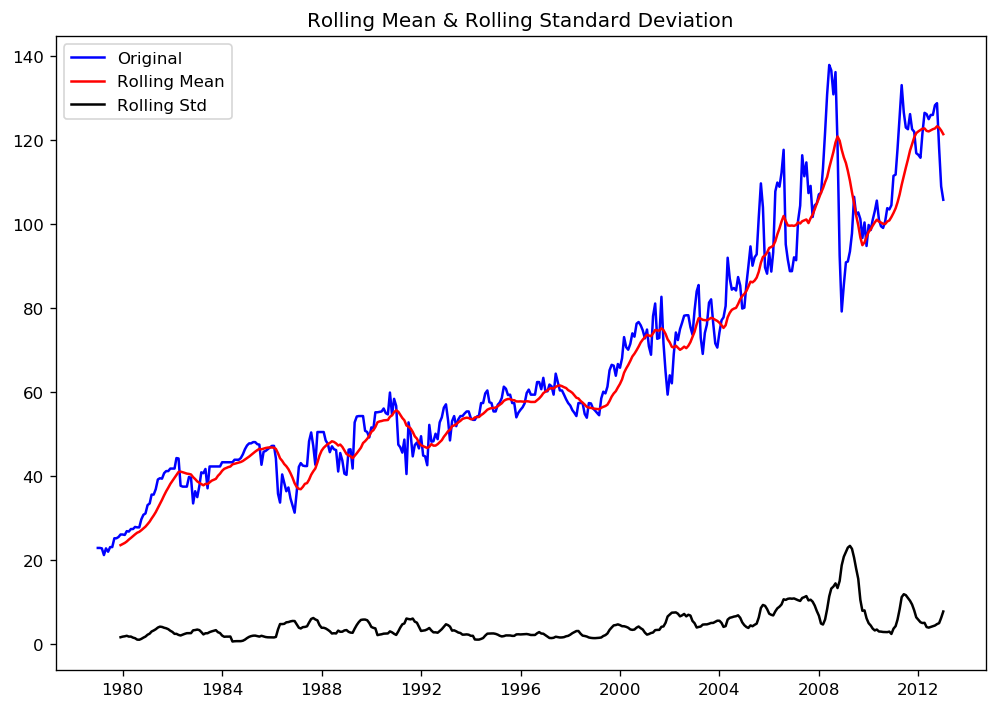

In [773]:
rolling_mean = Value_df.rolling(window = 12).mean()
rolling_std = Value_df.rolling(window = 12).std()
plt.plot(Value_df, color = 'blue', label = 'Original')
plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean')
plt.plot(rolling_std, color = 'black', label = 'Rolling Std')
plt.legend(loc = 'best')
plt.title('Rolling Mean & Rolling Standard Deviation')
plt.show()

- We see from the plot that the rolling mean changes with time. Therefore the time series is not stationary.  

In [774]:
result = adfuller(Value_df['VALUE'])
print('ADF Statistic: {}'.format(result[0]))
print('p-value: {}'.format(result[1]))
print('Critical Values:')
for key, value in result[4].items():
    print('\t{}: {}'.format(key, value))


ADF Statistic: -0.5076969573800486
p-value: 0.8905057146433946
Critical Values:
	1%: -3.4468044036406247
	5%: -2.868792838125
	10%: -2.57063355625


- We see that the ADF Statistic is far  from the critical values and the p-value is greater than the threshold (0.05). Therefore, the time series is not stationary.

##  Estimate and eliminate the trend

- We see that there is a significant positive trend. So we can apply transformation.


- This can be done by taking a log, square root, cube root, etc

-  Lets take log of the y-value to lower the rate at which rolling mean increases

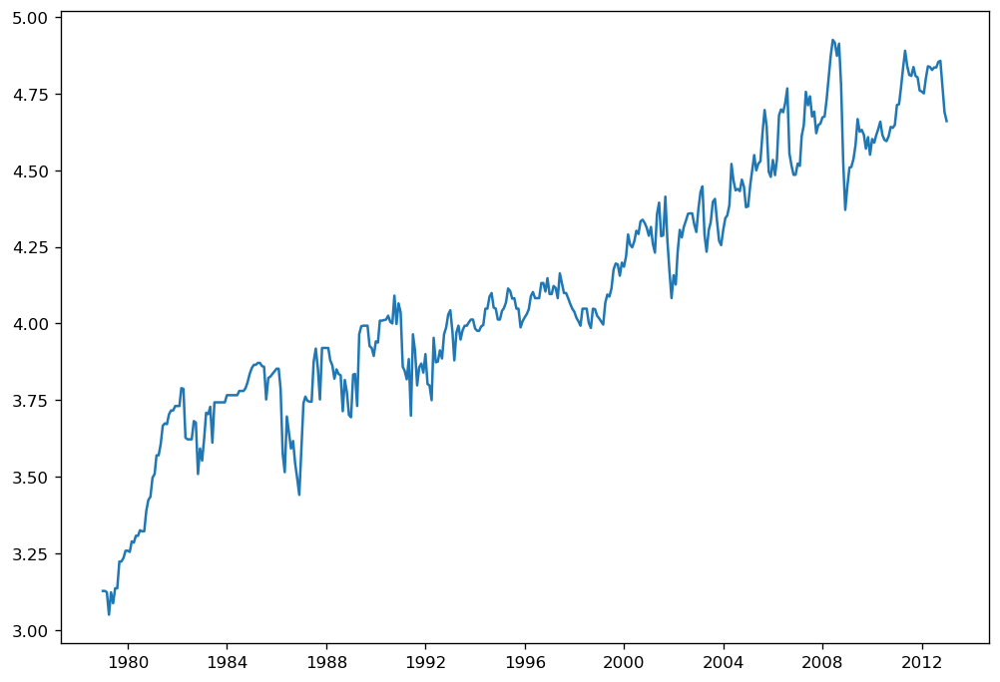

In [775]:
Value_df_log = np.log(Value_df)
plt.plot(Value_df_log)

- We can see that there is a forward trend in the data. The good part is that there is no very intuitive presence of noise. 


- We can apply some techniques to estimate or model this trend and then remove it from the series.

### Step 1: Find  Moving Average and subtract from the original

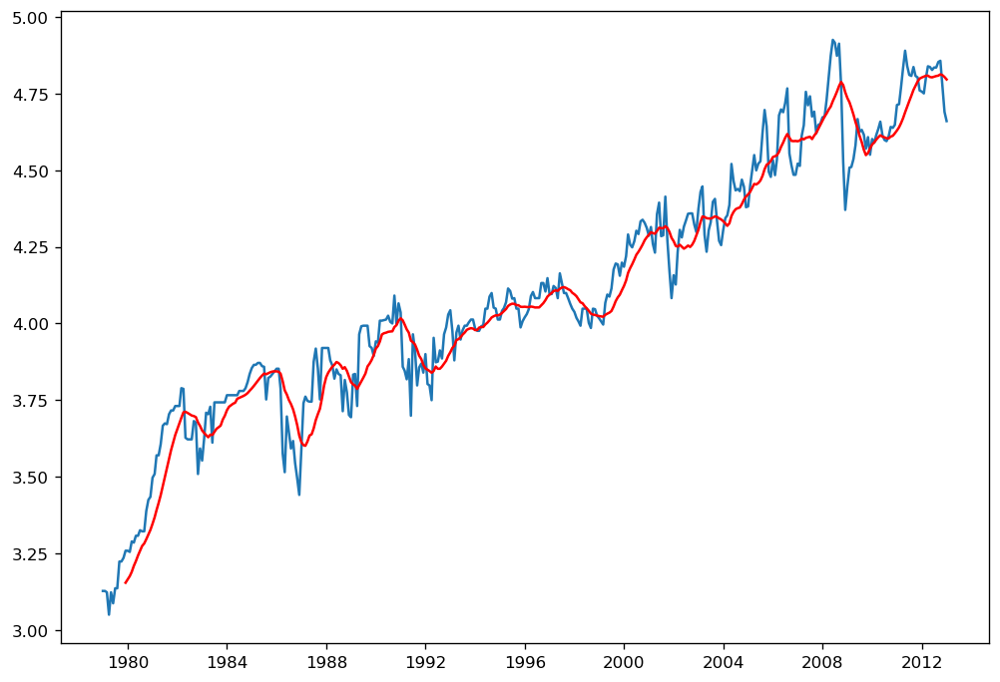

In [776]:
moving_avg = Value_df_log.rolling(12).mean()
plt.plot(Value_df_log)
plt.plot(moving_avg, color='red')

### Subtract  from the original mean

In [777]:
Value_df_log_moving_avg_diff = Value_df_log - moving_avg
Value_df_log_moving_avg_diff.head(12)

,VALUE
REF_DATE,
1979-01-01,NaN
1979-02-01,NaN
1979-03-01,NaN
1979-04-01,NaN
1979-05-01,NaN
1979-06-01,NaN
1979-07-01,NaN
1979-08-01,NaN
1979-09-01,NaN


### Lets further explore rolling statistics 

In [778]:
def dilli_stationarity(timeseries):
    
    # rolling statistics
    rolling_mean = timeseries.rolling(window=12).mean()
    rolling_std = timeseries.rolling(window=12).std()
    
    # rolling statistics plot
    original = plt.plot(timeseries, color='blue', label='Original')
    mean = plt.plot(rolling_mean, color='red', label='Rolling Mean')
    std = plt.plot(rolling_std, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    # Dickey–Fuller test:
    result = adfuller(timeseries['VALUE'])
    print('ADF Statistic: {}'.format(result[0]))
    print('p-value: {}'.format(result[1]))
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t{}: {}'.format(key, value))

#### Lets drop these NaN values from above 

In [779]:
Value_df_log_moving_avg_diff.dropna(inplace=True)

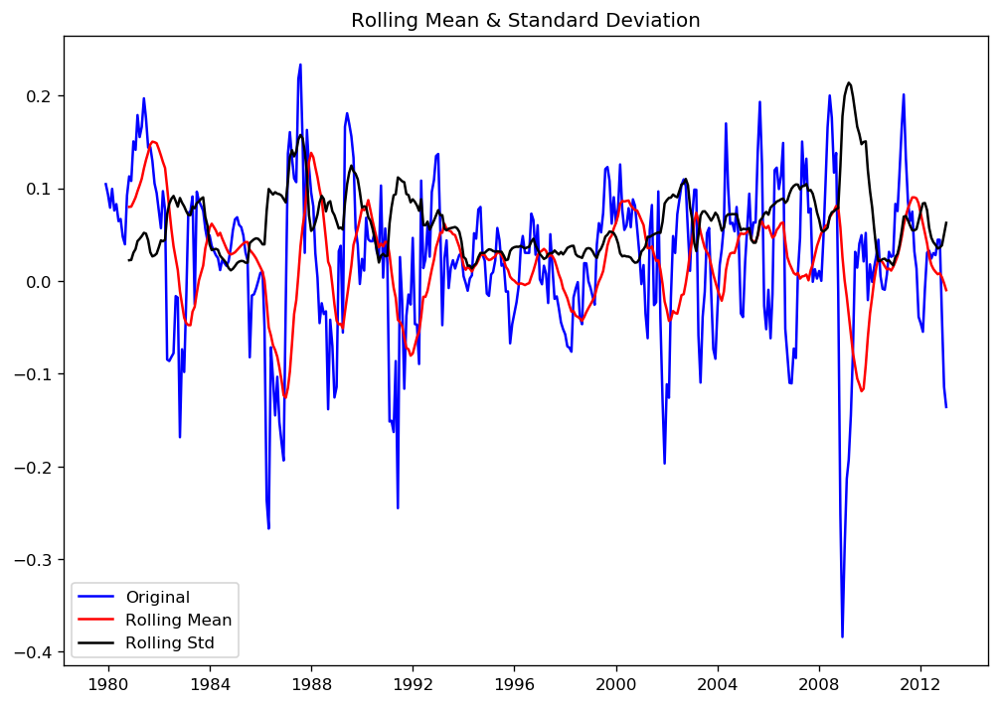

ADF Statistic: -7.349189745647575
p-value: 1.0165407958421599e-10
Critical Values:
	1%: -3.447099431978147
	5%: -2.8689225261604263
	10%: -2.57070269105012


In [780]:
dilli_stationarity(Value_df_log_moving_avg_diff)

- This looks much better!! Lets apply exponentially weighted moving average !

- There are various methods that can be applied to transform  non stationary time series to stationary. 

 ###  Step 2:  We subtract the rolling mean from the log plot

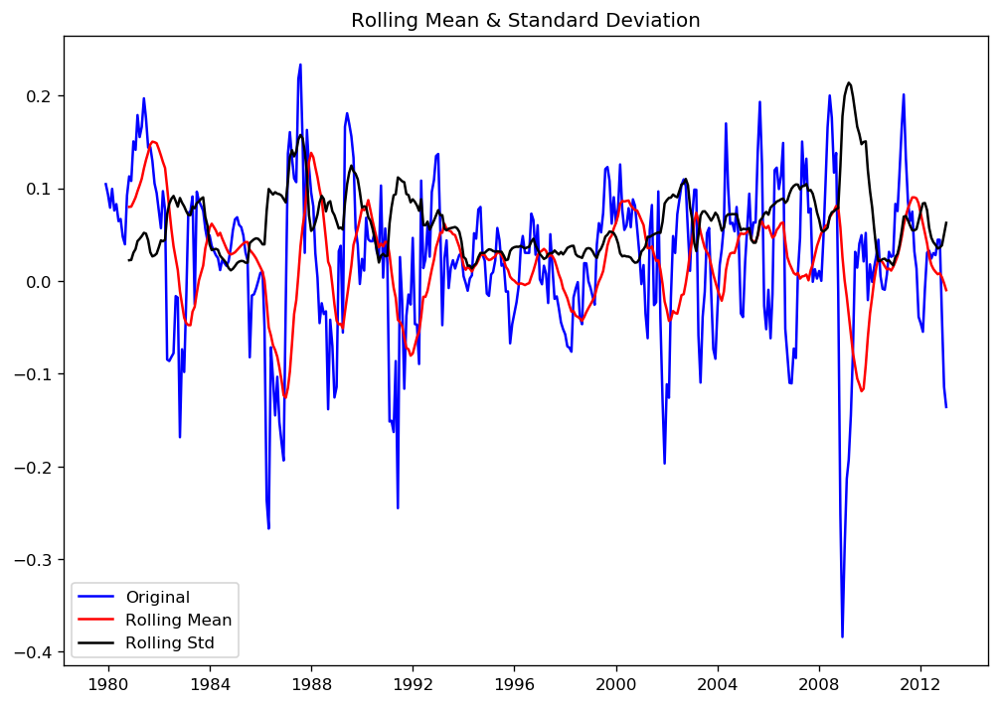

ADF Statistic: -7.349189745647575
p-value: 1.0165407958421599e-10
Critical Values:
	1%: -3.447099431978147
	5%: -2.8689225261604263
	10%: -2.57070269105012


In [781]:
rolling_mean = Value_df_log.rolling(window=12).mean()
Value_df_log_minus_mean = Value_df_log - rolling_mean
Value_df_log_minus_mean.dropna(inplace=True)
dilli_stationarity(Value_df_log_minus_mean)

- We see from the plot that the rolling mean and standard deviation are approximately parallel but the p -value is stil far off from threshold. 

 ## Step 3 : We apply exponential decay

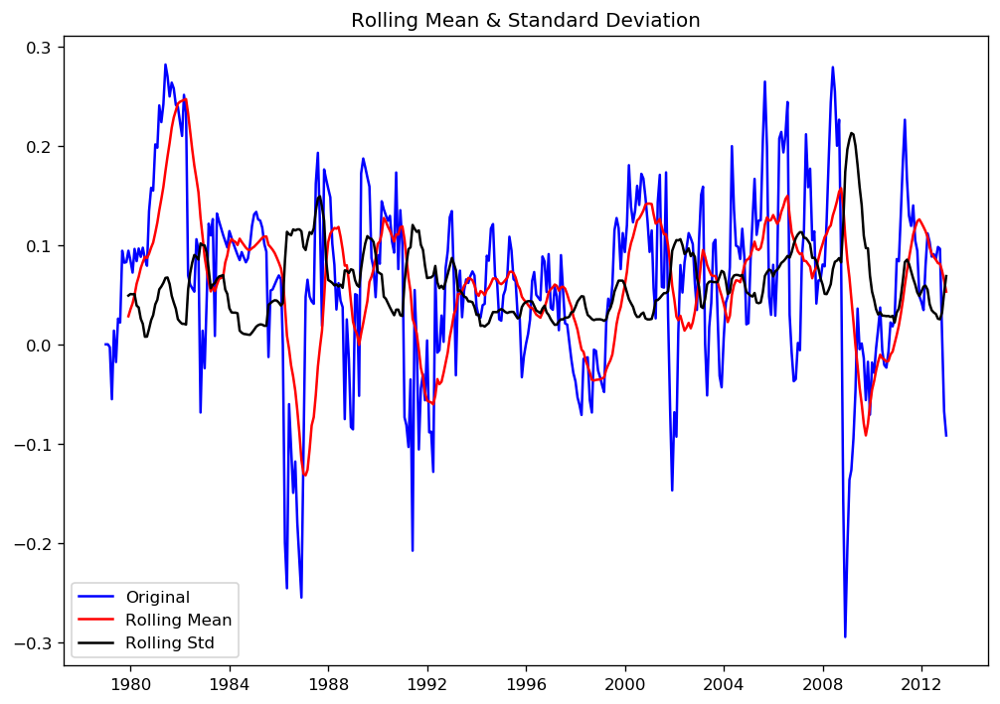

ADF Statistic: -6.508297925046371
p-value: 1.1167783484159815e-08
Critical Values:
	1%: -3.446479704252724
	5%: -2.8686500930967354
	10%: -2.5705574627547096


In [782]:
rolling_mean_exp_decay = Value_df_log.ewm(halflife=12, min_periods=0, adjust=True).mean()
Value_df_log_exp_decay = Value_df_log - rolling_mean_exp_decay
Value_df_log_exp_decay.dropna(inplace=True)
dilli_stationarity(Value_df_log_exp_decay)

- Altough the p-value is below the treshold, exponential method is also not stationary as there is still a change in shape over time.   

## Step 4:  We can aalso apply time shift, i.e. subtract point by the one that precided it. 

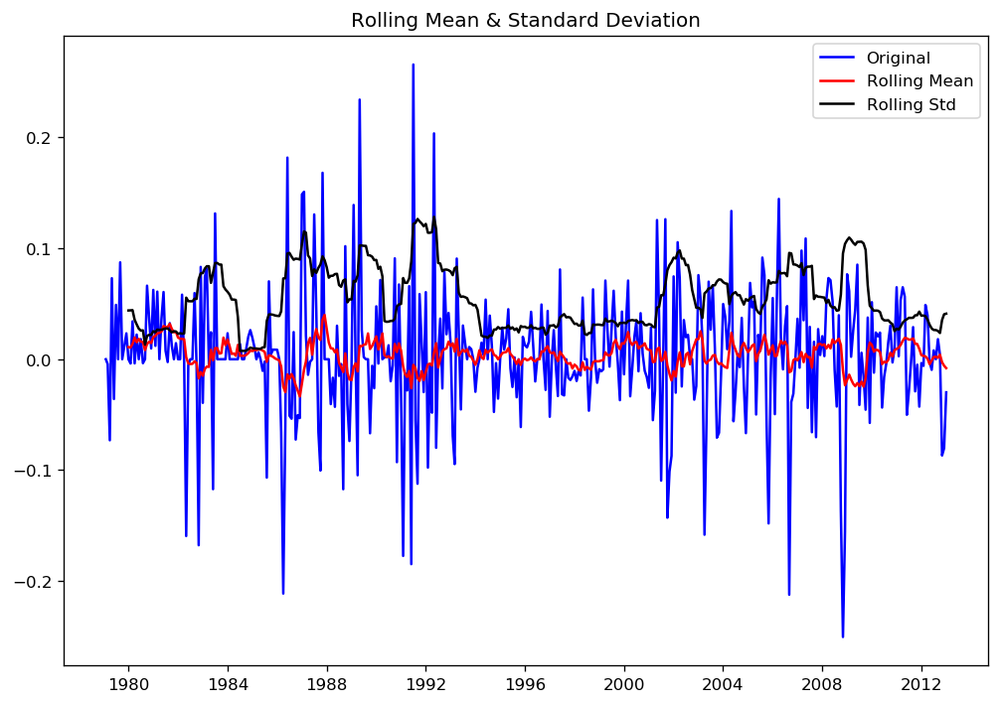

ADF Statistic: -9.49769117695164
p-value: 3.5127832856195973e-16
Critical Values:
	1%: -3.4468044036406247
	5%: -2.868792838125
	10%: -2.57063355625


In [783]:
Value_df_log_shift = Value_df_log - Value_df_log.shift()
Value_df_log_shift.dropna(inplace=True)
dilli_stationarity(Value_df_log_shift)

- Time shifting performed better than the first two methods, p-value is also below the threshold. 

## Seasional  Decomposition

In [784]:
Value_df

,VALUE
REF_DATE,
1979-01-01,22.8
1979-02-01,22.8
1979-03-01,22.7
1979-04-01,21.1
1979-05-01,22.7
...,...
2012-09-01,128.2
2012-10-01,128.7
2012-11-01,118.0


## Multiplicative Decomposition 

In [785]:
result_mul = seasonal_decompose(Value_df, model='multiplicative',
                                filt=None,
                                period=52,
                                two_sided=True,
                                extrapolate_trend=0,)

##  Additive Decomposition 

In [786]:
result_add = seasonal_decompose(Value_df, model='additive',
                                filt=None,
                                period=52,
                                two_sided=True,
                                extrapolate_trend=0,)

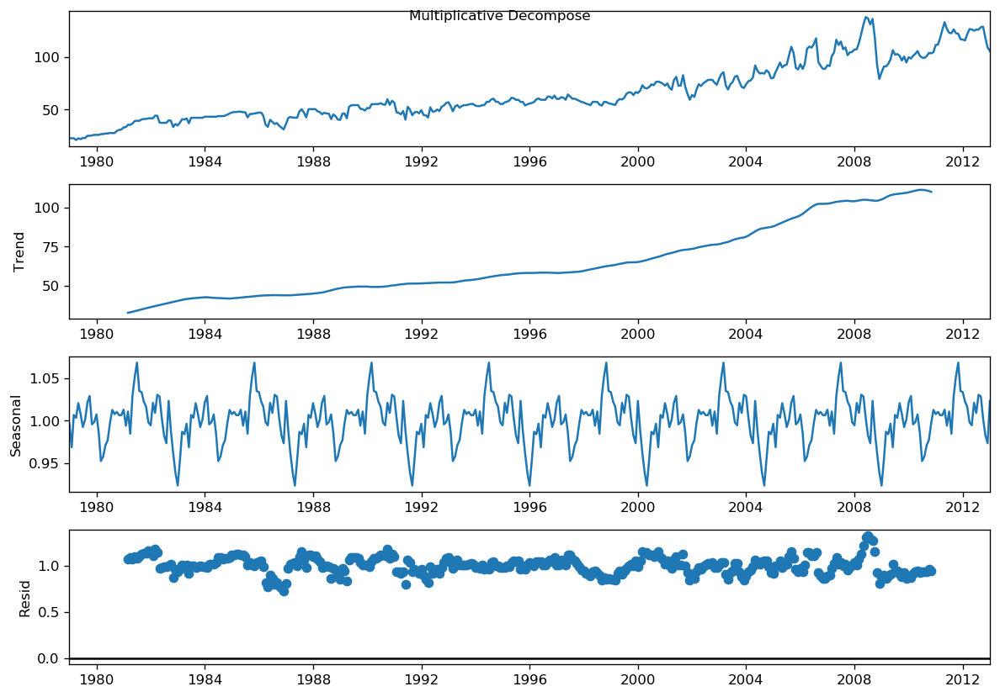

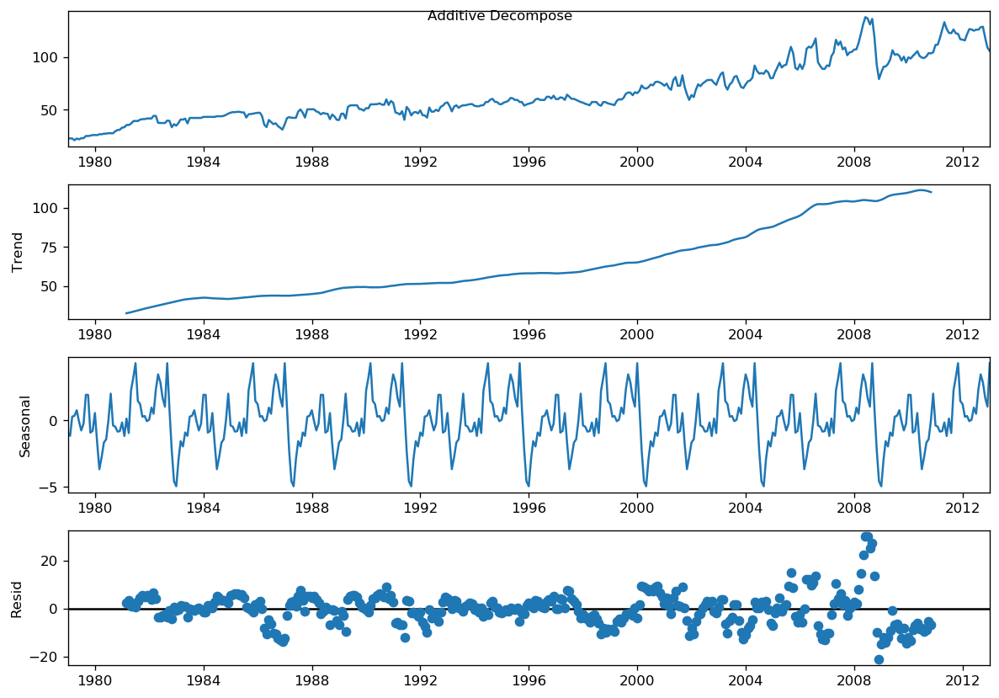

In [787]:
# Plot
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=10)
result_add.plot().suptitle('Additive Decompose', fontsize=10)
plt.show()

In [788]:
df_reconstructed = pd.concat([result_mul.seasonal, result_mul.trend, result_mul.resid, result_mul.observed], axis=1)
df_reconstructed.columns = ['seas', 'trend', 'resid', 'actual_values']
df_reconstructed.head()

,seas,trend,resid,actual_values
REF_DATE,,,,
1979-01-01,0.996477,NaN,NaN,22.8
1979-02-01,0.968937,NaN,NaN,22.8
1979-03-01,1.006802,NaN,NaN,22.7
1979-04-01,1.003504,NaN,NaN,21.1
1979-05-01,1.020613,NaN,NaN,22.7


## 2,1,1 ARIMA Model

In [789]:

model = ARIMA(Value_df['VALUE'], order=(2,1,1))
model_fit = model.fit(disp=0)
print(model_fit.summary())

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                             ARIMA Model Results                              
Dep. Variable:                D.VALUE   No. Observations:                  408
Model:                 ARIMA(2, 1, 1)   Log Likelihood               -1145.935
Method:                       css-mle   S.D. of innovations              4.010
Date:                Tue, 10 Mar 2020   AIC                           2301.871
Time:                        13:30:53   BIC                           2321.927
Sample:                    02-01-1979   HQIC                          2309.807
                         - 01-01-2013                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.2277      0.049      4.659      0.000       0.132       0.324
ar.L1.D.VALUE     1.0065      0.051     19.556      0.000       0.906       1.107
ar.L2.D.VALUE    -0.2011      0.050     

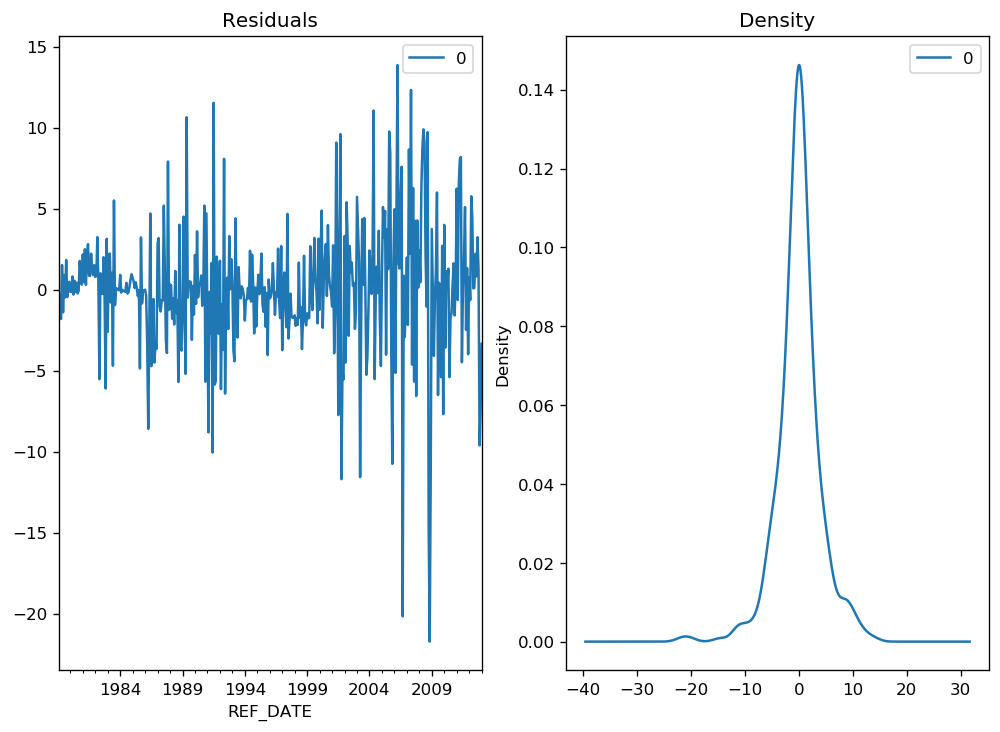

In [790]:
# Plot residual errors
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

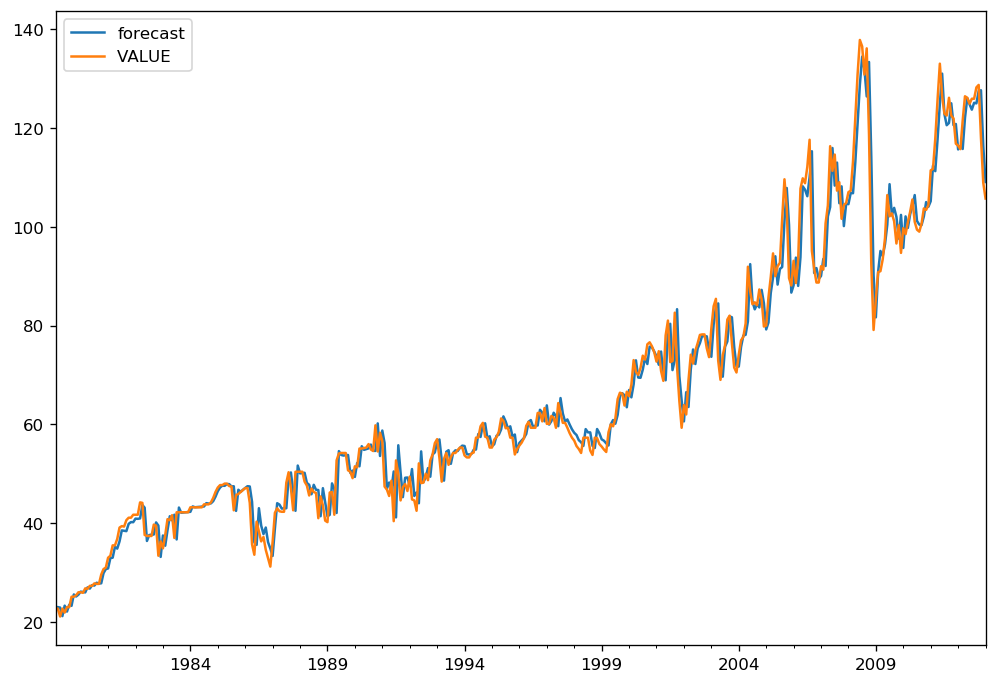

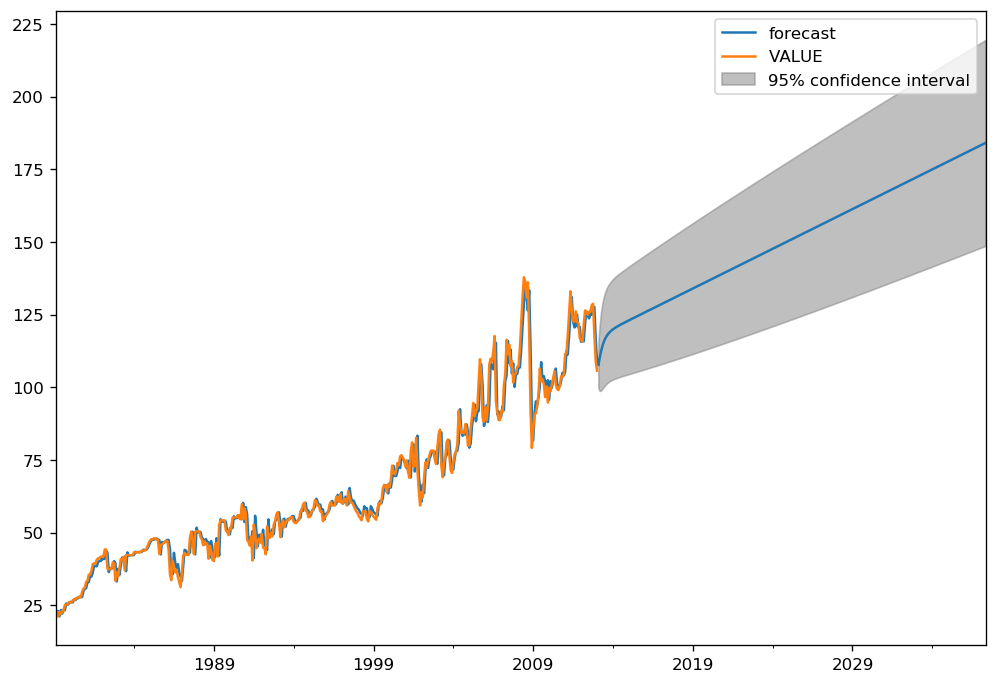

In [791]:
# Actual vs Fitted
model_fit.plot_predict(dynamic=False)
model_fit.plot_predict(1,700)
plt.show()

##  2,1,2 ARIMA Model

In [792]:
model = ARIMA(Value_df_log, order=(2,1,2))

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



In [793]:
results = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.VALUE   No. Observations:                  408
Model:                 ARIMA(2, 1, 1)   Log Likelihood               -1145.935
Method:                       css-mle   S.D. of innovations              4.010
Date:                Tue, 10 Mar 2020   AIC                           2301.871
Time:                        13:30:55   BIC                           2321.927
Sample:                    02-01-1979   HQIC                          2309.807
                         - 01-01-2013                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.2277      0.049      4.659      0.000       0.132       0.324
ar.L1.D.VALUE     1.0065      0.051     19.556      0.000       0.906       1.107
ar.L2.D.VALUE    -0.2011      0.050     

# Find the order of differencing (d)

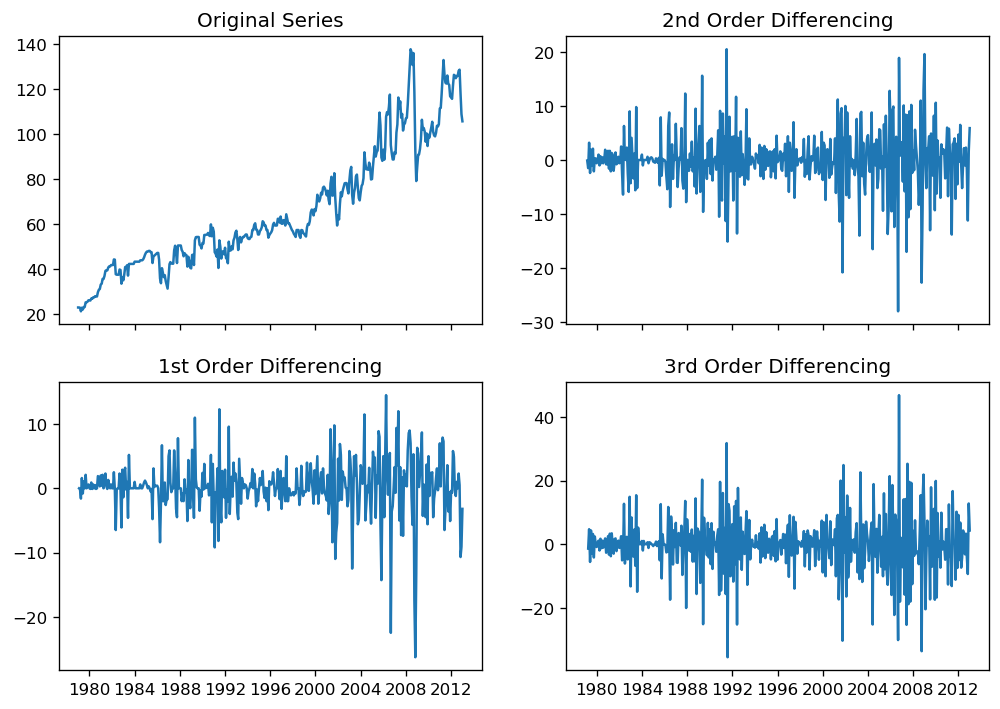

In [794]:
# Original Series
fig, axes = plt.subplots(2, 2, sharex=True)
axes[0, 0].plot(Value_df['VALUE']); axes[0, 0].set_title('Original Series')
#plot_acf(Value_df['VALUE'], ax=axes[0, 1])
#plot_acf(Value_df['VALUE'], ax =axes[0,1])

# 1st Differencing
axes[1, 0].plot(Value_df['VALUE'].diff()); axes[1, 0].set_title('1st Order Differencing')
#plot_acf(Value_df['VALUE'].diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[0, 1].plot(Value_df['VALUE'].diff().diff()); axes[0, 1].set_title('2nd Order Differencing')
#plot_acf(Value_df['VALUE'].diff().diff().dropna(), ax=axes[2, 1])

# 2nd Differencing
axes[1, 1].plot(Value_df['VALUE'].diff().diff().diff()); axes[1, 1].set_title('3rd Order Differencing')
#plot_acf(Value_df['VALUE'].diff().diff().dropna(), ax=axes[2, 1])




plt.show()

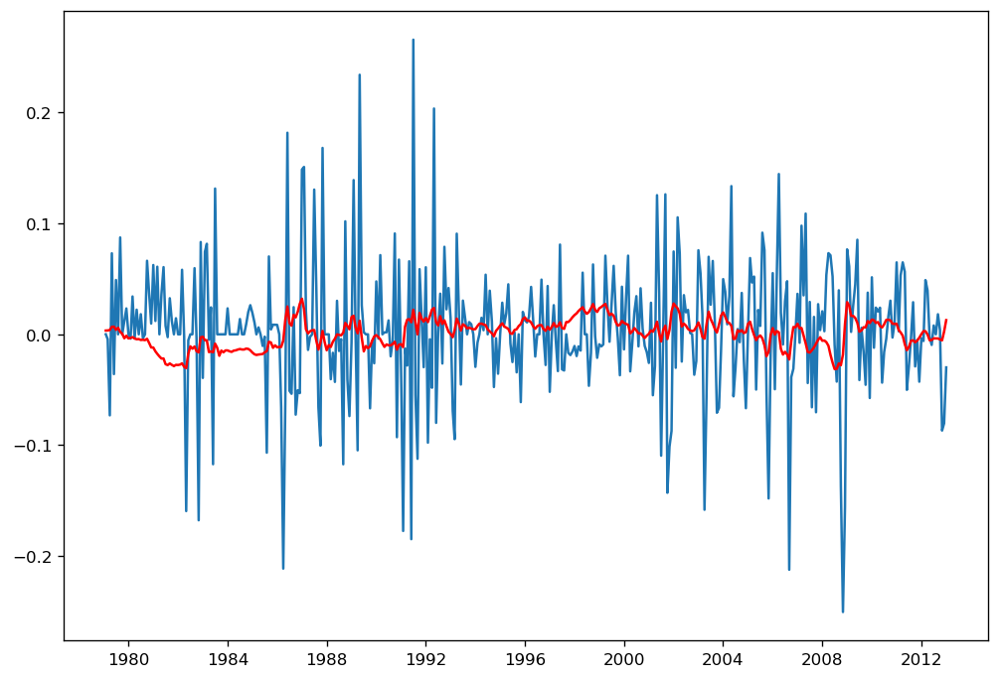

In [795]:
plt.plot(Value_df_log_shift)
plt.plot(results.fittedvalues, color='red')

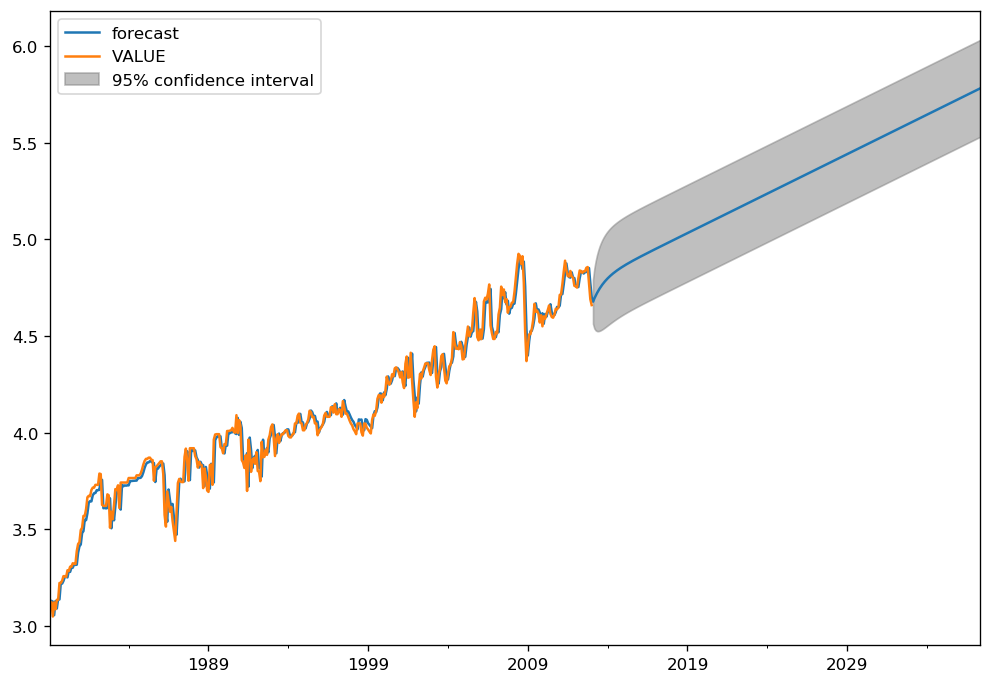

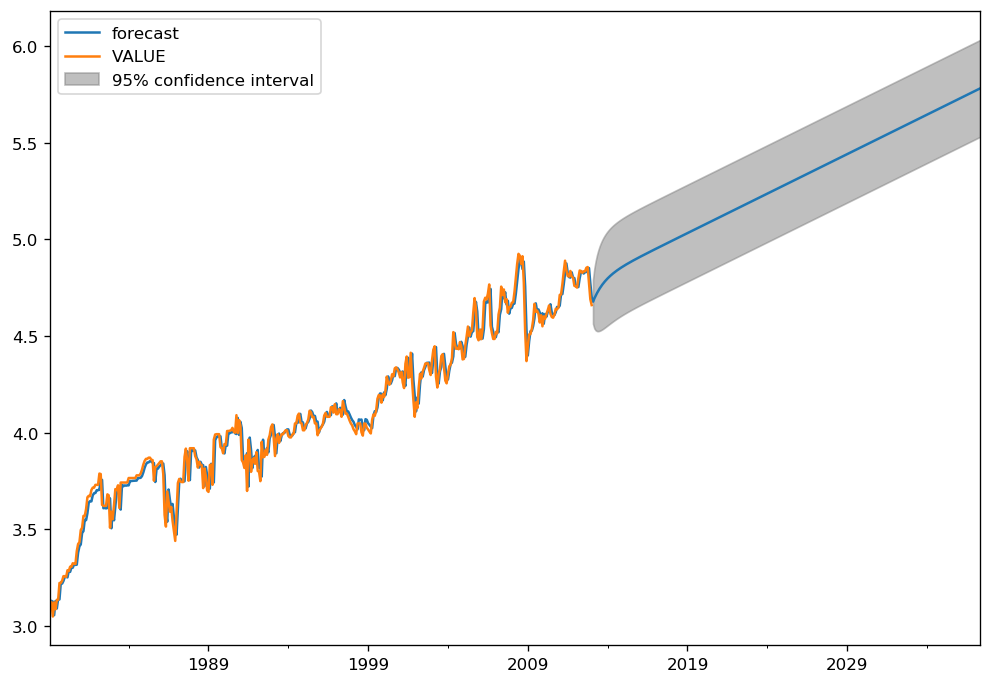

In [796]:
results.plot_predict(1,700)

##  1,1,2 ARIMA Model

In [797]:
model = ARIMA(Value_df_log, order=(1,1,2))
model_fit = model.fit(disp=0)
print(model_fit.summary())

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                             ARIMA Model Results                              
Dep. Variable:                D.VALUE   No. Observations:                  408
Model:                 ARIMA(1, 1, 2)   Log Likelihood                 580.250
Method:                       css-mle   S.D. of innovations              0.058
Date:                Tue, 10 Mar 2020   AIC                          -1150.501
Time:                        13:30:58   BIC                          -1130.445
Sample:                    02-01-1979   HQIC                         -1142.565
                         - 01-01-2013                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0034      0.000     16.332      0.000       0.003       0.004
ar.L1.D.VALUE     0.8882      0.028     32.002      0.000       0.834       0.943
ma.L1.D.VALUE    -0.9877      0.061    -

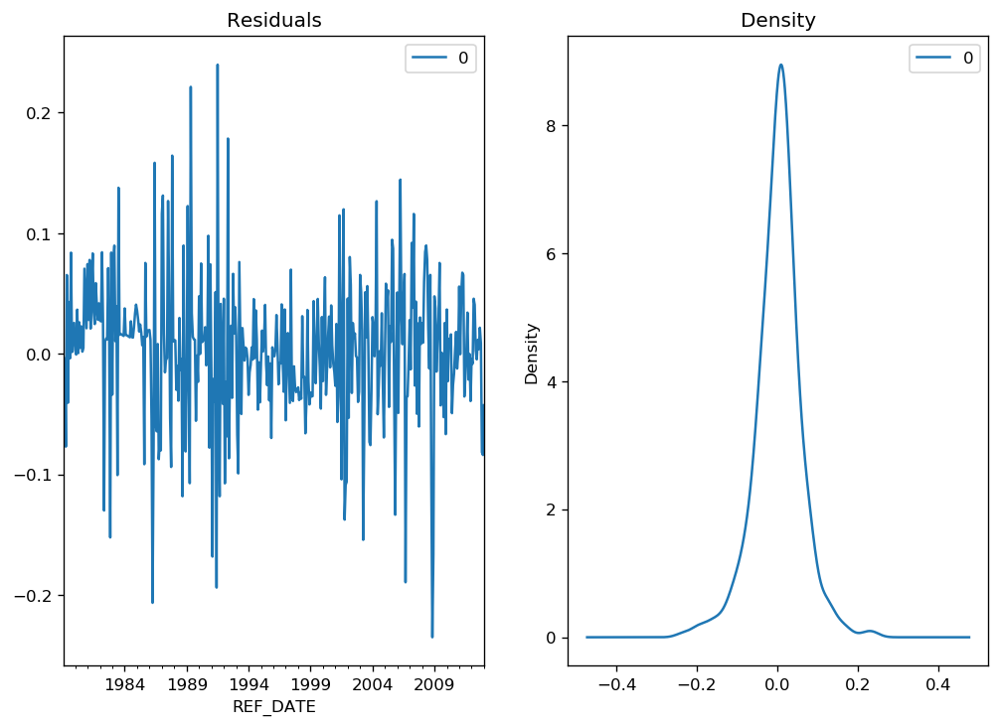

In [798]:
# Plot residual errors
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

##  1,1,1 ARIMA Model

In [799]:
model = ARIMA(Value_df_log, order=(1,1,1))
model_fit = model.fit(disp=0)
print(model_fit.summary())

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                             ARIMA Model Results                              
Dep. Variable:                D.VALUE   No. Observations:                  408
Model:                 ARIMA(1, 1, 1)   Log Likelihood                 580.230
Method:                       css-mle   S.D. of innovations              0.058
Date:                Tue, 10 Mar 2020   AIC                          -1152.461
Time:                        13:31:01   BIC                          -1136.415
Sample:                    02-01-1979   HQIC                         -1146.111
                         - 01-01-2013                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0034      0.000     16.159      0.000       0.003       0.004
ar.L1.D.VALUE     0.8909      0.024     37.369      0.000       0.844       0.938
ma.L1.D.VALUE    -1.0000      0.008   -1

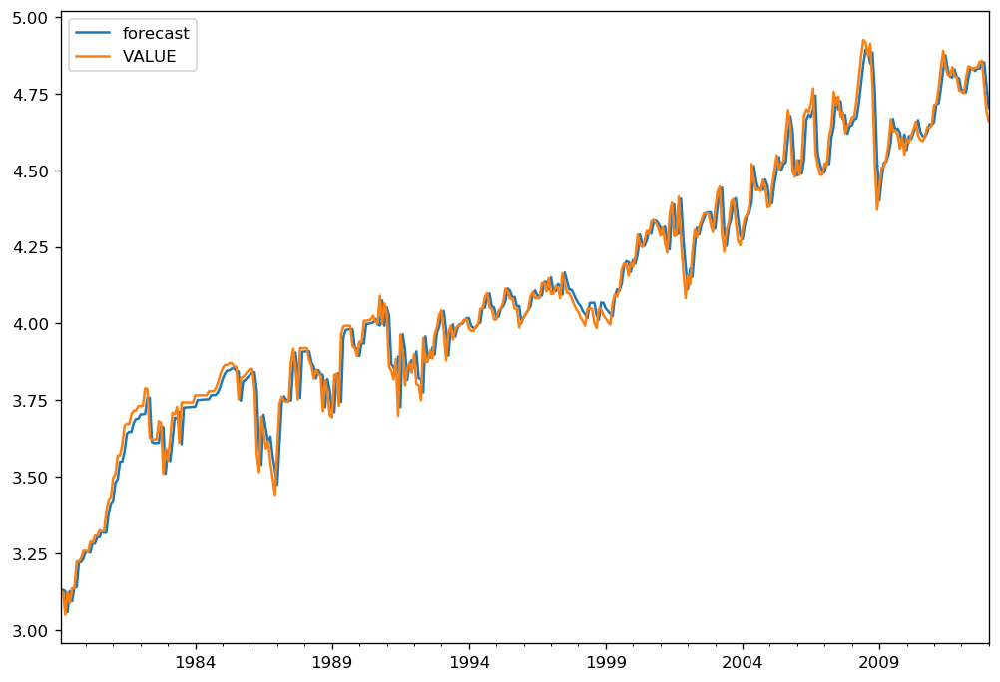

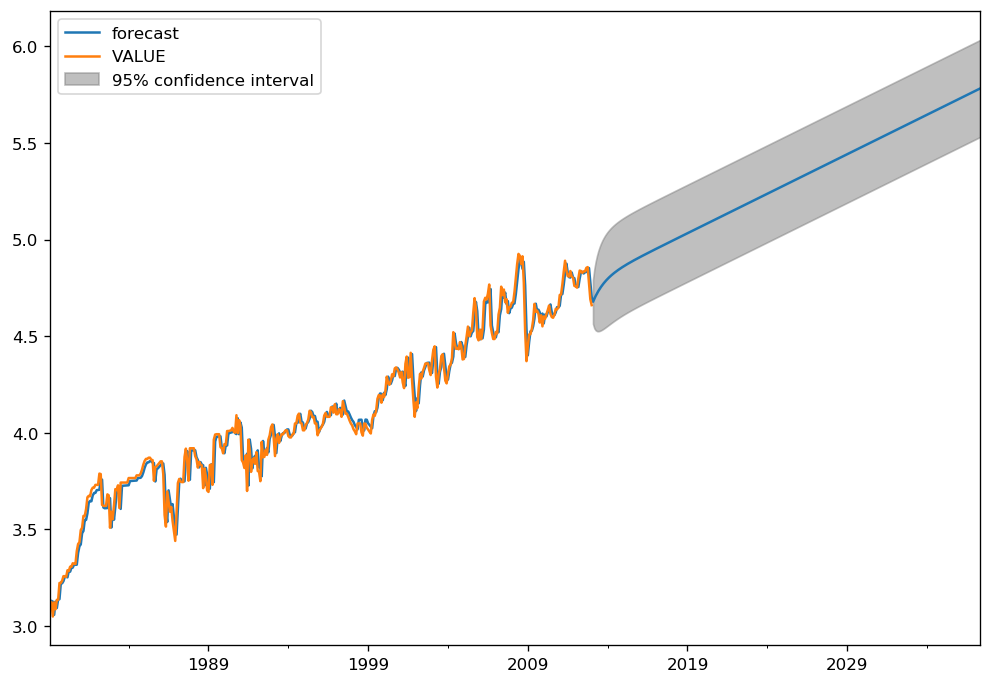

In [800]:
# Actual vs Fitted
model_fit.plot_predict(dynamic=False)
model_fit.plot_predict(1,700)
plt.show()

## Compare the Predictions

In [820]:
Value_df = reg_df[["REF_DATE","VALUE"]]
Value_df

,REF_DATE,VALUE
10,1979-01-01,22.8
25,1979-02-01,22.8
40,1979-03-01,22.7
55,1979-04-01,21.1
70,1979-05-01,22.7
...,...,...
34169,2012-09-01,128.2
34287,2012-10-01,128.7
34405,2012-11-01,118.0
34523,2012-12-01,108.9


In [821]:
Value_df=Value_df.set_index('REF_DATE')
Value_df

,VALUE
REF_DATE,
1979-01-01,22.8
1979-02-01,22.8
1979-03-01,22.7
1979-04-01,21.1
1979-05-01,22.7
...,...
2012-09-01,128.2
2012-10-01,128.7
2012-11-01,118.0


In [822]:
model = ARIMA(Value_df['VALUE'], order=(2,2,1))
model_fit = model.fit(disp=-1)
print(model_fit.summary())

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                             ARIMA Model Results                              
Dep. Variable:               D2.VALUE   No. Observations:                  407
Model:                 ARIMA(2, 2, 1)   Log Likelihood               -1159.413
Method:                       css-mle   S.D. of innovations              4.147
Date:                Tue, 10 Mar 2020   AIC                           2328.827
Time:                        13:34:57   BIC                           2348.871
Sample:                    03-01-1979   HQIC                          2336.759
                         - 01-01-2013                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -7.787e-05      0.002     -0.043      0.966      -0.004       0.003
ar.L1.D2.VALUE     0.1204      0.049      2.437      0.015       0.024       0.217
ar.L2.D2.VALUE    -0.0879      0.050

In [823]:
arima_pred = model_fit.predict(Value_df['VALUE'].index[300], Value_df['VALUE'].index[-1], typ="levels")

Text(0.5, 1.0, 'RMSE: nan')

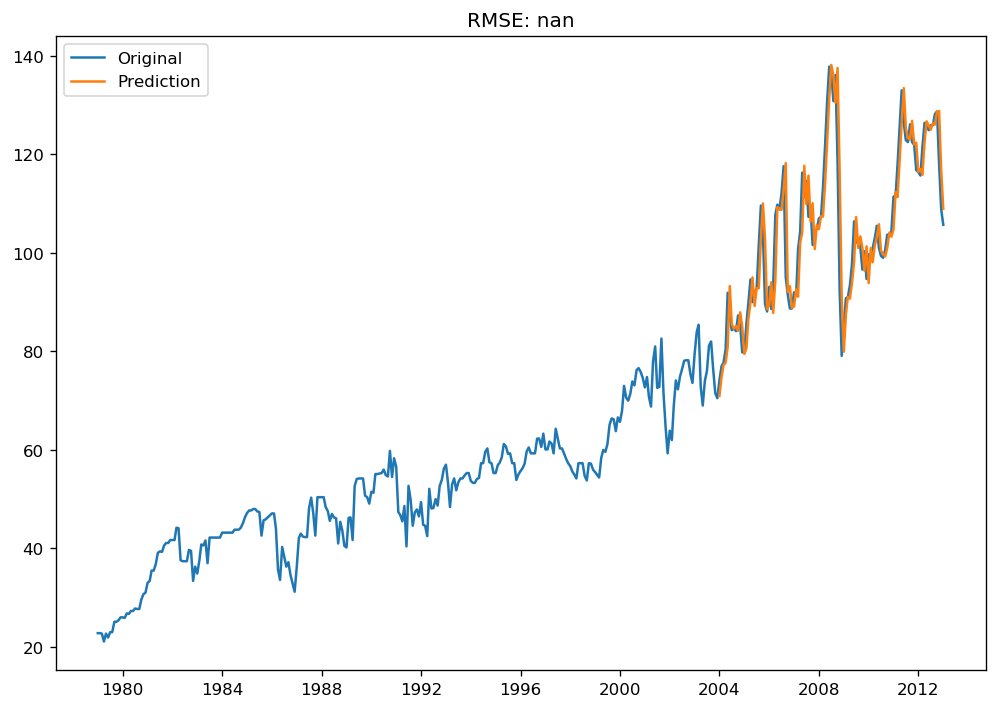

In [824]:
plt.plot(Value_df.VALUE, label='Original')
plt.plot(arima_pred, label='Prediction')
plt.legend(loc=2)
plt.title('RMSE: %.4f'% np.sqrt(sum((arima_pred-Value_df.VALUE[400:])**2)/len(Value_df.VALUE[400:])))

In [825]:
arima_pred_recent =model_fit.predict(Value_df['VALUE'].index[400], Value_df['VALUE'].index[-1], typ="levels")

Text(0.5, 1.0, 'RMSE: 4.6861')

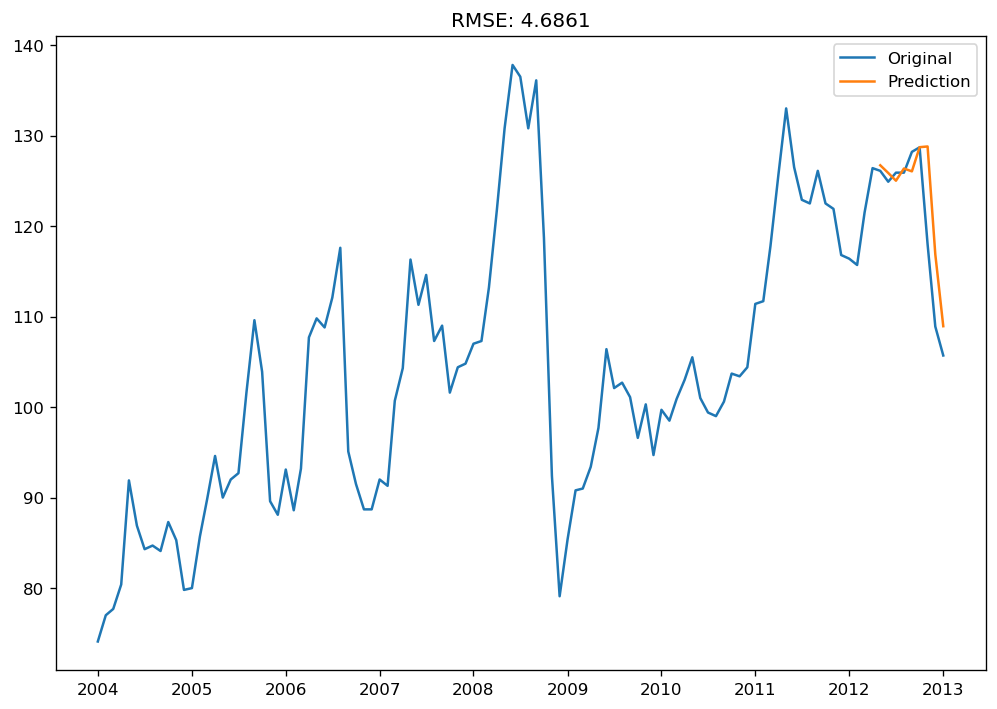

In [826]:
plt.plot(Value_df.VALUE[300:], label='Original')
plt.plot(arima_pred_recent, label='Prediction')
plt.legend(loc=1)
plt.title('RMSE: %.4f'% np.sqrt(sum((arima_pred_recent-Value_df.VALUE[400:])**2)/len(Value_df.VALUE[400:])))

##  AutoCorrelation Function (ACF)

- A Correlation coefficient for time series observation is a coefficient that describes a correlation between the time steps. The previous time step is called time lag.
- If the time step is between -1 and 1,  it describes a negative or positive correlation.  Similarly, a value of zero indicates no correlation.
- A correlation of  time series with values of the same series at previous times, i.e. with lag is called an autocorrelation.

In [827]:
from statsmodels.graphics.tsaplots import plot_acf

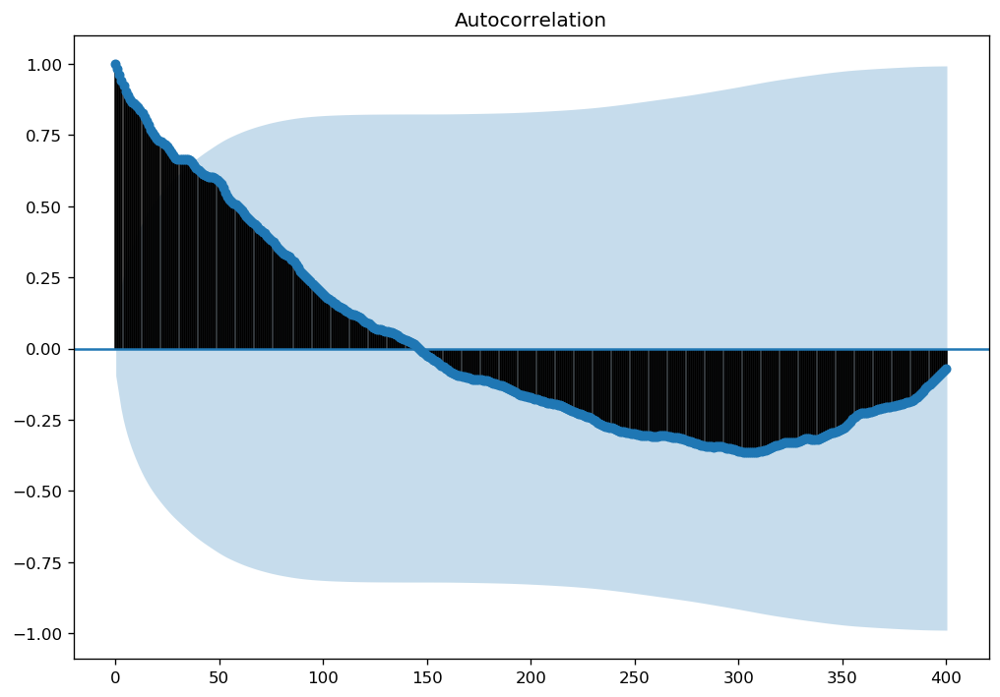

In [828]:
plot_acf(Value_df['VALUE'], lags=400)
plt.show() 

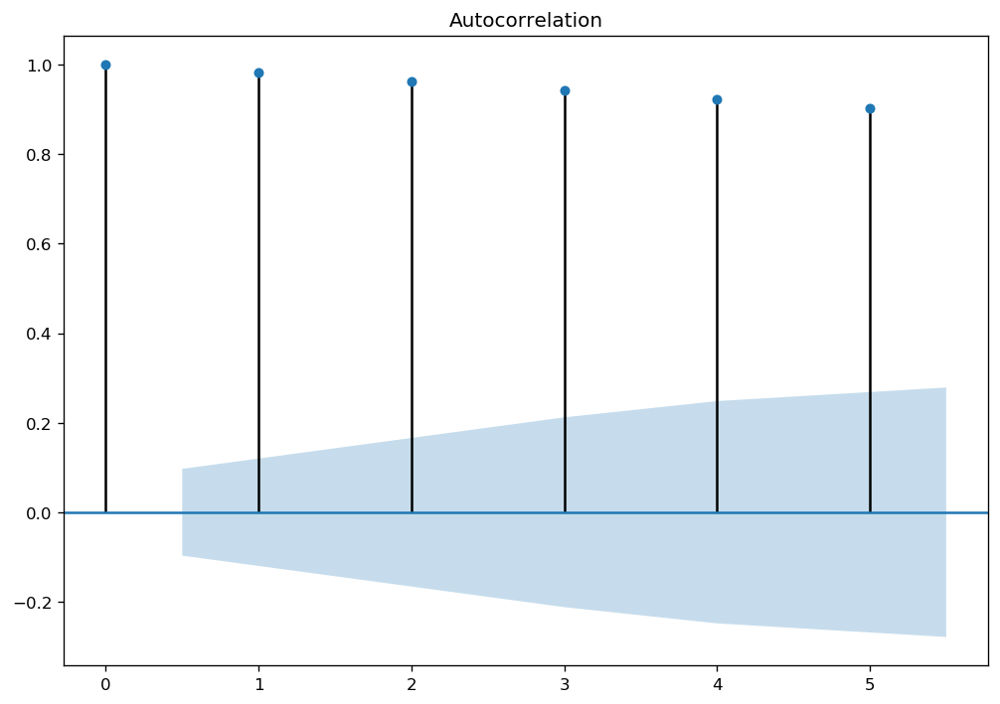

In [829]:
plot_acf(Value_df['VALUE'], lags=5)
plt.show() 

## Partial AutoCorrelation Function (PCAF0)

In [830]:
from statsmodels.graphics.tsaplots import plot_pacf

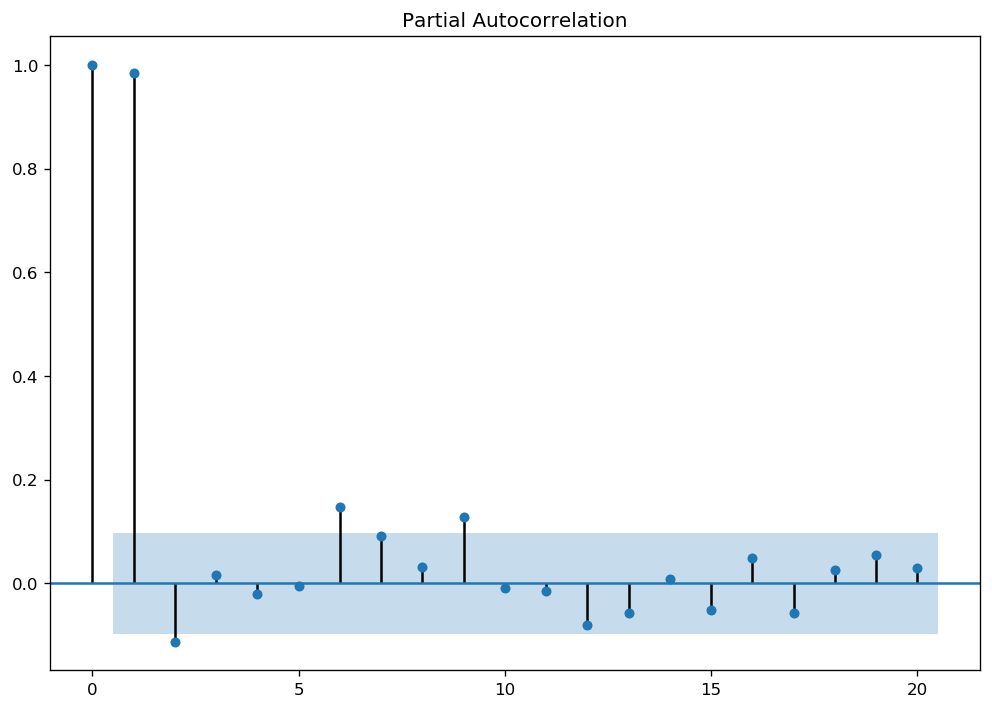

In [831]:
plot_pacf(Value_df['VALUE'],lags=20)
plt.show()

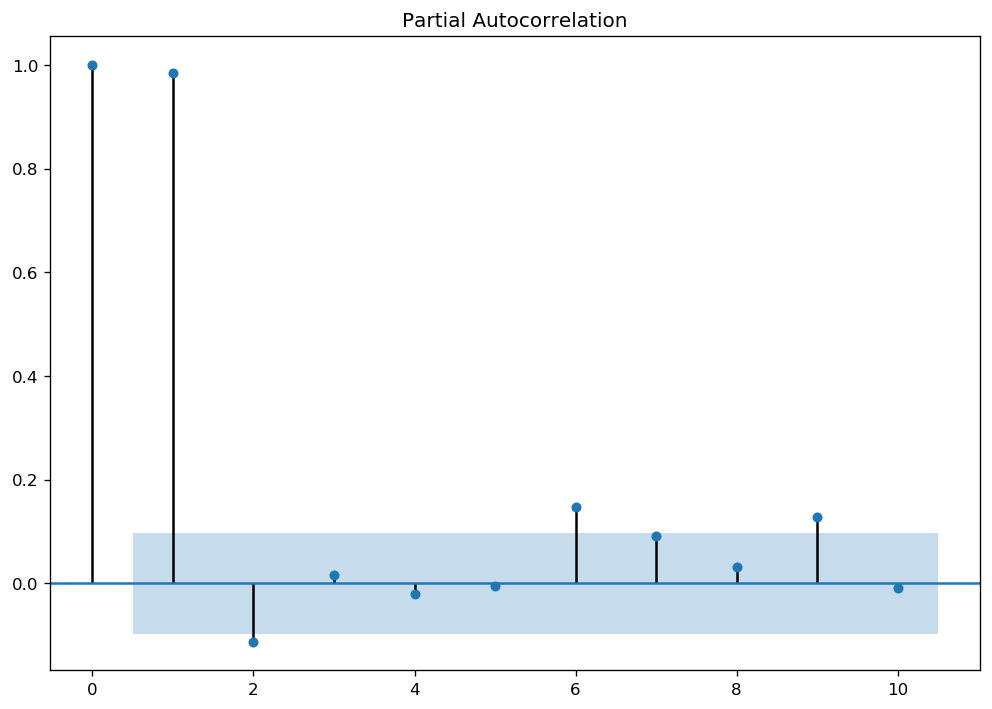

In [832]:
plot_pacf(Value_df['VALUE'],lags=10)
plt.show()

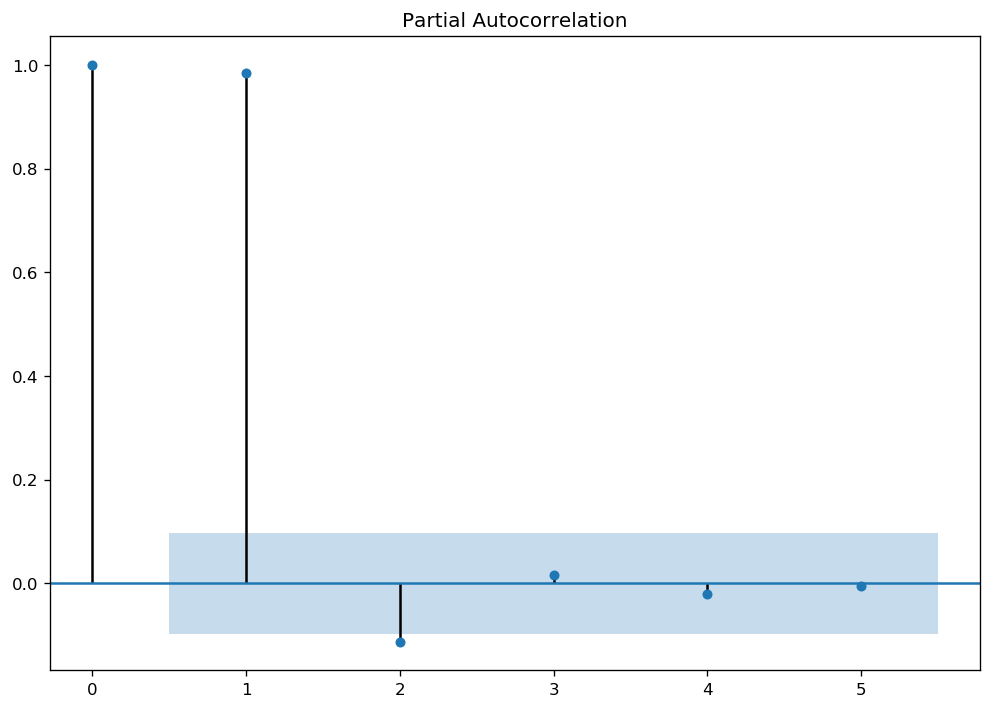

In [833]:
plot_pacf(Value_df['VALUE'],lags=5)
plt.show()

 # SARIMA Model

In [834]:
mod = sm.tsa.statespace.SARIMAX(Value_df['VALUE'], trend='n', order=(0,1,0), seasonal_order=(1,1,1,12))
results = mod.fit()

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



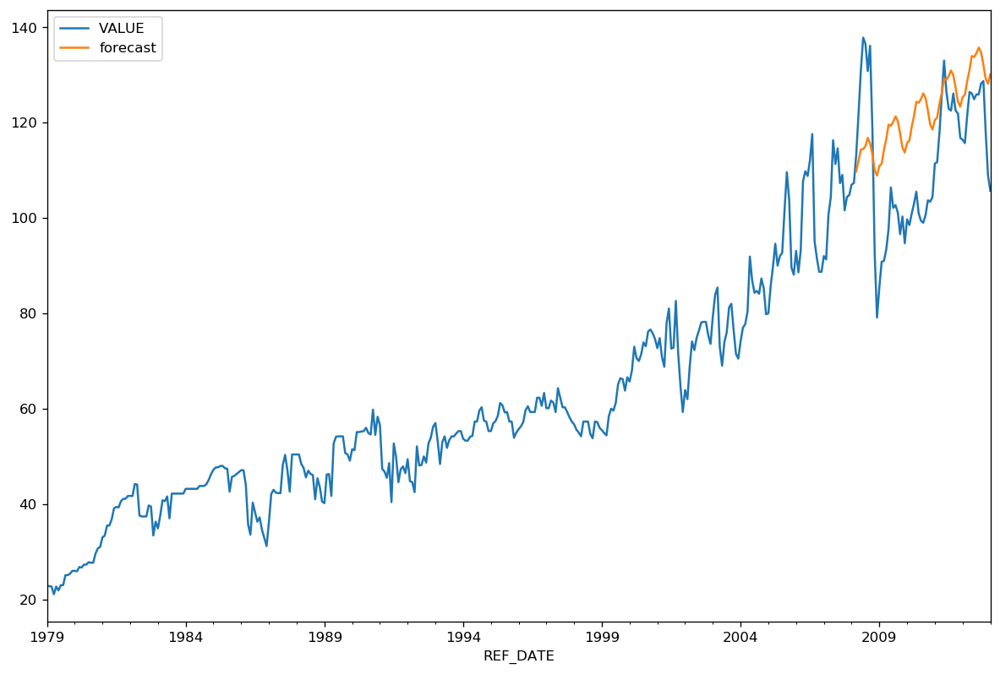

In [835]:
Value_df['forecast'] = results.predict(start = 350, end= 450, dynamic= True)  
Value_df[['VALUE', 'forecast']].plot(figsize=(12, 8))

In [836]:
from datetime import date, timedelta
from dateutil.relativedelta import relativedelta

In [837]:
start = datetime.datetime.strptime("1982-07-01", "%Y-%m-%d")
date_list = [start + relativedelta(months=x) for x in range(0,12)]
future = pd.DataFrame(index=date_list, columns= df.columns)
Value_df = pd.concat([Value_df, future])

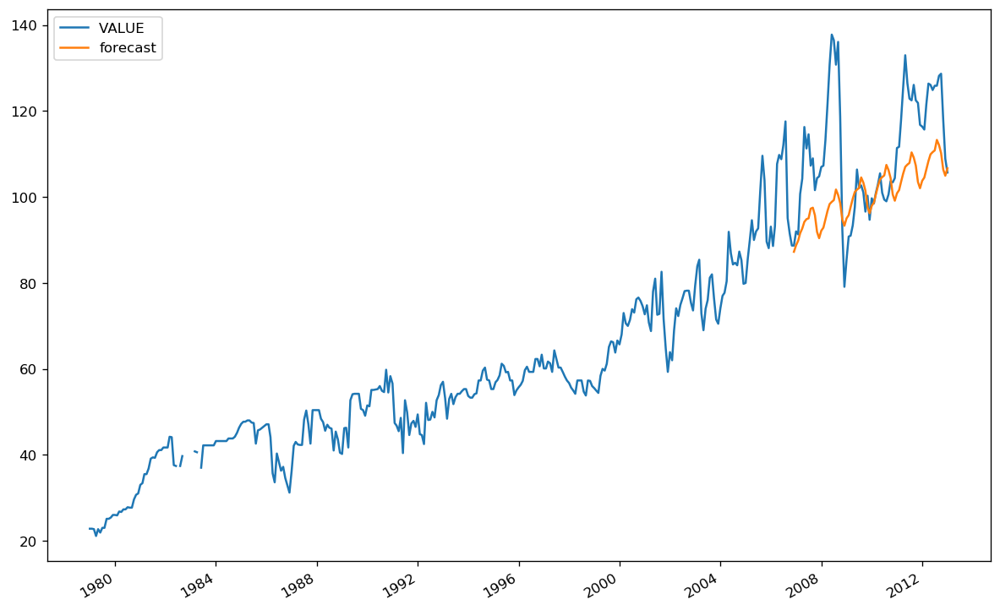

In [838]:
Value_df['forecast'] = results.predict(start = 335, end = 425, dynamic= True)  
Value_df[['VALUE', 'forecast']].plot(figsize=(12, 8)) 